# 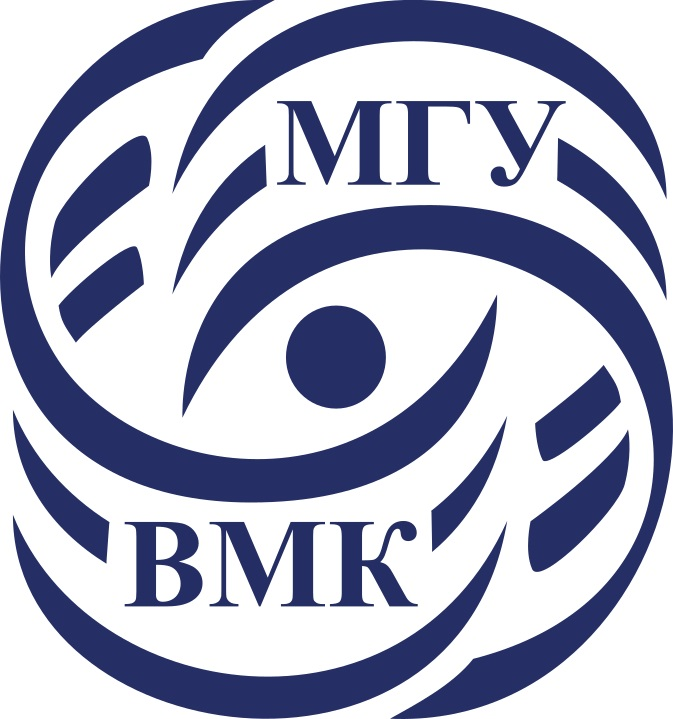

# Машинное обучение. ВМК МГУ

# Практическое задание 12: Кластеризация. Методы снижения размерности.





## Уровень: <font color='SkyBlue'>**Базовый (Base)**</font>

# О формате сдачи

🔷 **<font color='plum'>При решении ноутбука используйте данный шаблон</font>**

    ✅ Можно добавлять новые ячейки любых типов
    ❌ Не нужно удалять текстовые ячейки c разметкой частей ноутбука и формулировками заданий


🔷 **<font color='plum'>При оценивании задач учитывается код</font>**

    ✅ Задания, в которых необходим код, обычно помечаются фразами "Your code here"/"Ваш код" и аналогичными
    ❌ Ответы на вопросы без сопутствующего кода оцениваются в 0 баллов
    ❌ Наличе работоспособного кода в ноутбуке, если на сказано иного, обязательно

🔷 **<font color='plum'>При оценивании задач учитываются выводы</font>**

    ✅ Задания, в которых необходимы выводы, обычно помечаются фразами Вывод"/"Ответ на вопрос"/"Ваш текст" и аналогичными
    ✅ Обычно выводы подразумевают под собой текстовый ответ (можно писать markdown, latex).
    ✅ Сопутствующие изображения, графики, таблички - приветствуются!
    ❌ При отсутствии выводов задание не засчитается на полный балл

-----------
<font color="white" style="opacity:0.2024"></font>







__В этом задании вы..:__

* Познакомитесь с одним способом визуализации процесса обучения
* Сравните между собой результаты разных способов кластеризации
* Посмотрите и реализуете несколько метрик качества кластеризации
* Попробуете разные методы снижения размерности

----

<font color="white" style="opacity:0.2024"></font>
<font color=DarkOrange>**Примерное время выполнения (execution time/время выполнения, если нажать run all) всех ячеек ноутбука при правильной реализации: 30 минут </font>**

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

Перед началом выполнения переведите ноутбук в `Доверенный режим` (`Trusted`) для корректного отображения изображений:

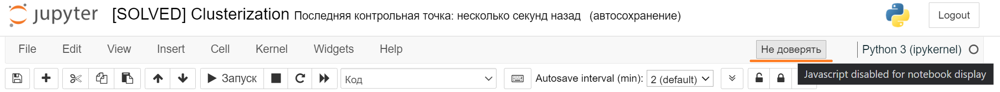

In [1]:
%config Completer.use_jedi = False
%load_ext autoreload
%autoreload 2
import os

os.add_dll_directory("C:\\Windows\\System32")

<AddedDllDirectory('C:\\Windows\\System32')>

In [2]:
import tensorflow as tf

print(tf.__version__)

2.19.0


----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

# Подготовка рабочей среды

Сначала установим нужные нам версии библиотек. Мы гарантируем, что в данных версиях задание будет корректно отрабатывать.

После установки нужных версий, **возможно,** нужно перезагрузить среду (runtime), но скорее всего вам это не понадобится


На скачивание файла и установку понадобится не более 5 минут.

<font color='OrangeRed'>**Важно!**</font>

Устанавливать нужные версии нужно каждый раз, когда создается новый рантайм. Например, если вы 2 часа подряд делаете это задание, то подготовить библиотеки достаточно 1 раз. Но если вы, например, начали в понедельник, затем закрыли/выключили ноутбук, то при продолжении в среду, вам нужно будет запустить рантайм заново и следовательно заново установить библиотеки.

<font color='OrangeRed'>**Важно!**</font>
Если вы предпочитаете делать практические задания на своем личном ноутбуке, то проверьте, что вы установили рабочее окружение в [соответствии с гайдом](https://github.com/MSU-ML-COURSE/ML-COURSE-24-25/blob/main/tutorials/%D0%A2%D1%83%D1%82%D0%BE%D1%80%D0%B8%D0%B0%D0%BB%20%D0%BF%D0%BE%20%D1%83%D1%81%D1%82%D0%B0%D0%BD%D0%BE%D0%B2%D0%BA%D0%B5%20%D1%80%D0%B0%D0%B1%D0%BE%D1%87%D0%B5%D0%B3%D0%BE%20%D0%BE%D0%BA%D1%80%D1%83%D0%B6%D0%B5%D0%BD%D0%B8%D1%8F%20%D0%B2%20Python%20%D0%B4%D0%BB%D1%8F%20%D1%80%D0%B5%D1%88%D0%B5%D0%BD%D0%B8%D1%8F%20%D0%B7%D0%B0%D0%B4%D0%B0%D1%87%20(2).pdf)

-----

<font color='OrangeRed'>**Важно!**</font> В этом задании мы будем использовать полное виртуальное окружение, так как понадобятся библиотеки `torch` и `tensorflow`

Обратите внимание, что установка `torch` и `tensorflow` через `pip `может сломать ваше окружение, особенно если вы используете GPU. Выполняйте их установку в соответствии с Вашей конфигурацией системы или в отдельном виртуальном окружении

In [ ]:
# # !!! Данный блок будет работать только в Google-Colab !!!
# ! gdown 19ZRLAdlNBI5OScrbxXzO3iaWJSkJlXeA
# ! pip install -r /content/requirements_2024_25_for_colab_full.txt

In [3]:
import catboost

assert (catboost.__version__ == '1.2.7')

Теперь можно приступать к выполнению задания! :)

-----------
<font color="white" style="opacity:0.2024"></font>

# <font color='DarkOrange'>0. Введение. [1 балл]</font>

## 0.1 О задании

В данной работе вам предстоит познакомится с методами машинного обучения без учителя — кластеризацией и алгоритмами снижения размерности.

 Рекомендуется использовать Kaggle так как в нём корректно работают интерактивные визуализации.

Здесь перечислены основные функции и библиотеки, которые могут понадобиться Вам в процессе выполнения задания. Подключение других библиотек возможно, но нежелательно. **Работа каких-либо других библиотек не гарантируется.**

In [48]:
import gdown

import scipy

import numpy as np

import tqdm.auto as tqdm

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

from ipywidgets import interactive, fixed, interact_manual, IntSlider, FloatLogSlider, FloatSlider, Dropdown, \
    ToggleButtons, interact

import torch
from torchvision.datasets import CIFAR10

os.environ["KERAS_BACKEND"] = "tensorflow"
# Необходима преварительная установка tensorflow
from keras.applications.inception_v3 import InceptionV3, preprocess_input

import sklearn

from sklearn.decomposition import KernelPCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering

# Библиотека umap-learn, а не umap
from umap import UMAP
from sklearn.manifold import TSNE, Isomap

from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification, make_moons, make_blobs
from sklearn.preprocessing import StandardScaler, MinMaxScaler

from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning

simplefilter("ignore", category=ConvergenceWarning)

## <font color='DarkOrange'>0.3 Введение в интерактивные графики jupyter notebook [кросспроверка 1 балл]</font>

Информация об особенностях интерактивных графиков вынесена в отдельный ноутбук `Deep dive into .ipynb.ipynb`. **Ознакомьтесь с ним перед дальнейшим выполнением задания!**

#### **Задание 0.0 [кросспроверка, 1 балл][код, вопрос]**
* Поиграйтесь с интерактивными графиками.
* Посмотрите в чём заключается смысл функций [`interactive`, `interact_manual`, `fixed`, `IntSlider`, `FloatLogSlider`](https://ipywidgets.readthedocs.io/en/latest/examples/Using%20Interact.html).
* Какие ещё [слайдеры и динамические виджеты бывают](https://ipywidgets.readthedocs.io/en/latest/examples/Widget%20List.html)?
* Как вам кажется, удобный ли это инструмент?
* Предложите несколько примеров, когда он мог бы ещё пригодиться.

In [8]:
def plot_sine(freq, amplitude, phase):
    x = np.linspace(0, 2 * np.pi, 500)
    y = amplitude * np.sin(freq * x + phase)
    plt.figure(figsize=(6, 3))
    plt.plot(x, y)
    plt.ylim(-1.2 * amplitude, 1.2 * amplitude)
    plt.title(f"Sine: freq={freq}, amp={amplitude}, phase={phase}")
    plt.grid(True)
    plt.show()


interactive(plot_sine,
            freq=FloatLogSlider(min=-1, max=1, step=0.1, value=1, description='freq'),
            amplitude=IntSlider(min=1, max=5, step=1, value=1, description='amp'),
            phase=FloatSlider(min=0, max=2 * np.pi, step=0.1, value=0, description='phase'))


interactive(children=(FloatLogSlider(value=1.0, description='freq', max=1.0, min=-1.0), IntSlider(value=1, des…

<font color='MediumOrchid'>**Ваш ответ здесь:**</font> (ｏ・_・)ノ”(ノ_<、):

Когда интерактивность может быть полезна:
1. Подбор гиперпараметров ML-моделей
    - Изменять скорость обучения, глубину дерева, параметры регуляризации и сразу смотреть метрики.
2. Обучение и демонстрация математических концепций
    - Параметрическая кривая с настраиваемыми коэффициентами.
    - Иллюстрация преобразований Фурье, вращения и масштабирования функций.
3. Анализ данных с pandas
    - Фильтрация таблицы по диапазону значений, мгновенное обновление диаграммы.
4. Географические приложения
    - Перемещение временной шкалы на карте для анимации изменения данных.



**<font color='OrangeRed'>Обратите внимание</font>, что динамическое содержимое может некорректно сохраняться в jupyter notebook. Используйте его только для локальной визуализации. Все графики, необходимые для сдачи задания должны быть статическими. Переход в статический режим происходит с помощью магической команды `%matplotlib inline`.**

**<font color='OrangeRed'>Обязательно убедитесь, что все графики корректно сохранились корректно в ноутбуке перед сдачей в систему.</font>**

In [9]:
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 300

## 0.4 Ещё несколько важных замечаний

При выполнении задания запрещено:
1. Менять те seed, которые явно указаны в коде
2. Менять прототипы функций, классов, методов классов
3. Менять константы, используемые для генерации выборок

При оформлении задания обратите внимание на форматирование кода и на оформление графиков:

* Весь код должен быть оформлен в строгом соответствии с [PEP8](https://pep8.org/)

Графики должны быть с одной стороны понятными и информативными, а с другой стороны *красивыми*. Вот несколько пунктов, которые помогут удовлетворить этим требования:
1. Все графики должны быть отрисованы в **векторном формате**. Обратите внимание, что смена режима графиков с динамического на статический и обратно может приводить к сбросу параметров отрисовки графиков. Переход в векторный режим можно выполнить с помощью команды `matplotlib_inline.backend_inline.set_matplotlib_formats('pdf', 'svg')`. Если изображения в векторном формате приводят к слишком большому размеру Jupyter Notebook можете использовать растровые изображения с **высоким dpi**. Напирмер, можно установить глобальный dpi в matplotlib: `matplotlib.rcParams['figure.dpi'] = 300`
2. На всех графиках без исключения должна быть нарисована сетка
3. Все графики и группы графиков должны иметь заголовок (`title`)
4. При необходимости оси должны быть подписаны
5. Если на графике отображено несколько сущностей (линии/точки/bar разных цветов, формы и так далее), то необходима исчерпывающая легенда
6. Все линии на графиках должны быть чётко видны (нет похожих цветов или цветов, сливающихся с фоном и так далее)
7. Масштаб по каждой оси на графике должен быть выбран правильно. Используйте масштабы `log`, `symlog` по необходимости
8. Если отображена величина, имеющая очевидный диапазон значений (например, проценты могут быть от 0 до 100), то желательно масштабировать ось на весь диапазон значений (исключением является случай, когда вам необходимо показать малое отличие, которое незаметно в таких масштабах)
9. Частота отметок по каждой оси должна быть тщательно подобрана, по необходимости задавайте `[xy]ticks`, `[xy]ticklabels` вручную. Подписи тиков на осях не должны сливаться как на одной оси, так и между ними
10. Помните, что matplotlib умеет выполнять [рендеринг Latex](https://matplotlib.org/stable/gallery/text_labels_and_annotations/tex_demo.html). Используйте эту возможность для написания формул в заголовках, легенде и в подписях осей
11. Используйте *красивую* цветовую палитру с хорошо различимыми цветами. Примеры цветовых палитр можно посмотреть [здесь](https://matplotlib.org/stable/gallery/color/colormap_reference.html). При наличи особенностей восприятия цвета можно использовать специальные палитры:
```python
plt.style.use('seaborn-colorblind')
# Или
plt.style.use('tableau-colorblind10')
# Затем, при отрисовке графиков не используйте параметр cmap
```
12. Графики должны быть не супер-микро и не супер-макро по размерам, так, чтобы можно было увидеть все, что нужно

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

# <font color='DarkOrange'>1. Кластеризация на синтетических данных. [кросспроверка 5 балла,  unittests 4 балла]</font>

В данной части мы рассмотрим несколько наборов синтетических данных и сравним как разные алгоритмы кластеризации ведут себя в низкоразмерных и высокоразмерных пространствах

## a. Двумерные данные

Сгенерируем двумерные данные с $4$ естественными кластерами разного размера и плотности.

In [10]:
data_moons, labels_moons = make_moons(n_samples=300, shuffle=True, noise=0.09, random_state=6417)
data_moons, labels_moons = data_moons[labels_moons == 0], labels_moons[labels_moons == 0]

data_blobs, labels_blobs = make_blobs(
    n_samples=500, n_features=2, centers=[(0, -0.2), (-1.5, -1.5), (-1.5, 1.5)],
    cluster_std=[0.2, 0.4, 0.6], center_box=(-10.0, 10.0),
    shuffle=True, random_state=6417, return_centers=False
)

data = np.concatenate([data_moons, data_blobs])
labels = np.concatenate([labels_moons, labels_blobs + 1])

Определим вспомогательную функцию для отрисовки двумерных кластеризованных данных. При выполенении задания желательно пользоваться этой функцией для визуализации. При необходимости можете менять сигнатуру и поведение функции как вам удобно, _оставляя стиль отрисовки в целом неизменным_.

In [11]:
def plot_2d_data(data, labels, title='Исходные данные', cmap='tab20', ax=None):
    """
    Отрисовка 2d scatter plot.
    :param np.ndarray data: 2d массив точек
    :param Union[list, np.ndarray] labels: список меток для каждой точки выборки
    :param str title: Заголовок графика
    :param str cmap: Цветовая палитра
    :param ax Optional[matplotlib.axes.Axes]: Оси для отрисовки графика.
        Если оси не заданы, то создаётся новая фигура и сразу же происходит её отрисовка
        Иначе, график добавляется на существующие оси. Отрисовки фигуры не происходит
    """
    n_clusters = len(np.unique(labels))

    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    else:
        fig = None

    scatter = ax.scatter(
        data[:, 0], data[:, 1], c=labels,
        cmap=plt.get_cmap(cmap, n_clusters)
    )

    cbar = plt.colorbar(scatter, label='Номер кластера', ax=ax)
    cbar.set_ticks(np.min(labels) + (np.arange(n_clusters) + 0.5) * (n_clusters - 1) / n_clusters)
    cbar.set_ticklabels(np.unique(labels))

    ax.set_title(title)
    ax.grid(True)

    if fig is not None:
        fig.tight_layout()
        plt.show()

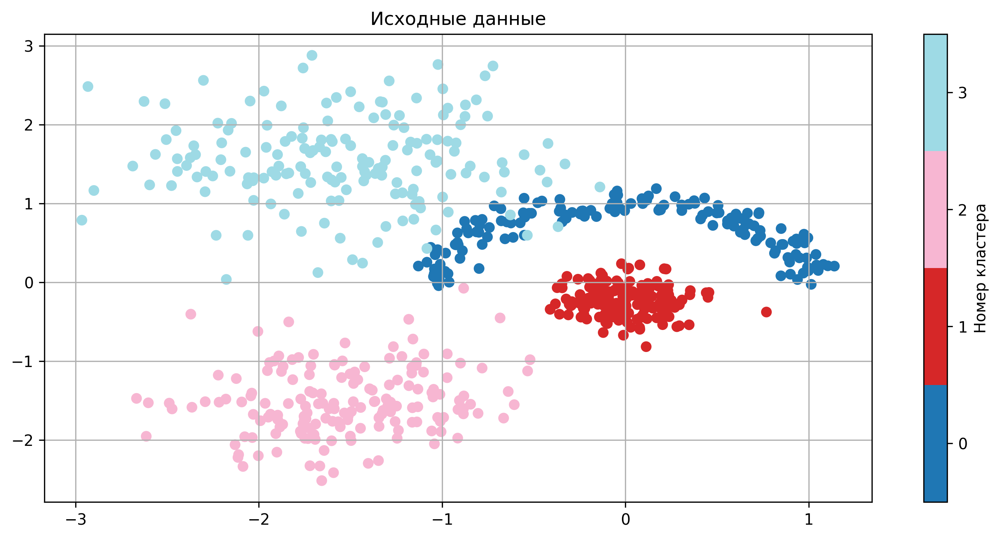

In [12]:
plot_2d_data(data, labels, title='Исходные данные', cmap='tab20')

#### <font color='DarkOrange'>**Задание 1.a.1 [кросспроверка, 1 балл][код]** </font>
<a id='task_1.a.1'></a>
Запустите следующие алгоритмы кластеризации на данной выборке: `KMeans`, `DBSCAN`, `AgglomerativeClustering`. Визуально подберите наилучшие параметры для этих алгоритмов (`n_clusters`, `eps`, `min_samples`, `linkage`). Изобразите наилучшие получившиеся разбиения на графиках.

<font color='LightSteelBlue'>**Советы**</font>
1. Можете использовать виджеты для ручного подбора параметров
2. Используйте `plot_2d_data` для отрисовки графиков. Обязательно меняйте заголовок
3. **<font color='OrangeRed'>Помните, динамический контент может не сохраняться в ноутбуке. Поэтому после подбора оптимальных параметров нарисуйте соответствующий рисунок в статическом режиме</font>**

In [17]:
def tune_kmeans(n_clusters: int):
    labels_km = KMeans(n_clusters=n_clusters, random_state=0).fit_predict(data)
    plot_2d_data(data, labels_km, title=f'KMeans → n_clusters={n_clusters}', cmap='tab20')


interactive(tune_kmeans,
            n_clusters=IntSlider(min=2, max=10, step=1, value=4, description='n_clusters'))

interactive(children=(IntSlider(value=4, description='n_clusters', max=10, min=2), Output()), _dom_classes=('w…

In [31]:
def tune_dbscan(eps: float, min_samples: int):
    labels_db = DBSCAN(eps=eps, min_samples=min_samples).fit_predict(data)
    plot_2d_data(data, labels_db, title=f'DBSCAN → eps={eps:.2f}, min_samples={min_samples}')


interactive(tune_dbscan,
            eps=FloatSlider(min=0.05, max=1.0, step=0.05, value=0.25, description='eps'),
            min_samples=IntSlider(min=1, max=30, step=1, value=5, description='min_samples'))


interactive(children=(FloatSlider(value=0.25, description='eps', max=1.0, min=0.05, step=0.05), IntSlider(valu…

In [27]:
def tune_agg(n_clusters: int, linkage: str):
    labels_ag = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage).fit_predict(data)
    plot_2d_data(data, labels_ag, title=f'Agglomerative → n_clusters={n_clusters}, linkage={linkage}')


interactive(tune_agg,
            n_clusters=IntSlider(min=2, max=10, step=1, value=4, description='n_clusters'),
            linkage=ToggleButtons(options=['ward', 'complete', 'average', 'single'], value='ward',
                                  description='linkage'))


interactive(children=(IntSlider(value=4, description='n_clusters', max=10, min=2), ToggleButtons(description='…

C:\Users\mozhu\PycharmProjects\ML_2024\.venv\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


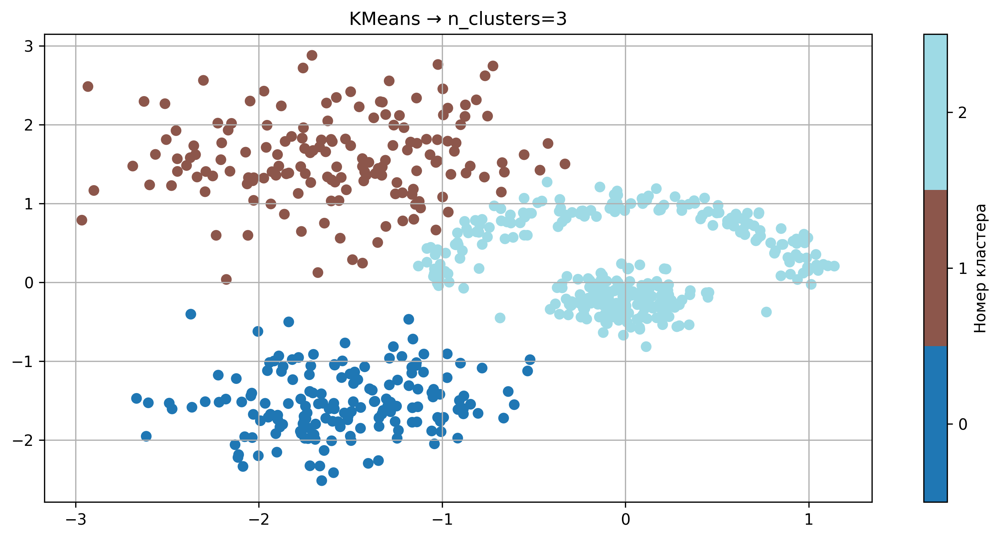

In [29]:
plot_2d_data(data, KMeans(n_clusters=3, random_state=0).fit_predict(data), title=f'KMeans → n_clusters={3}')

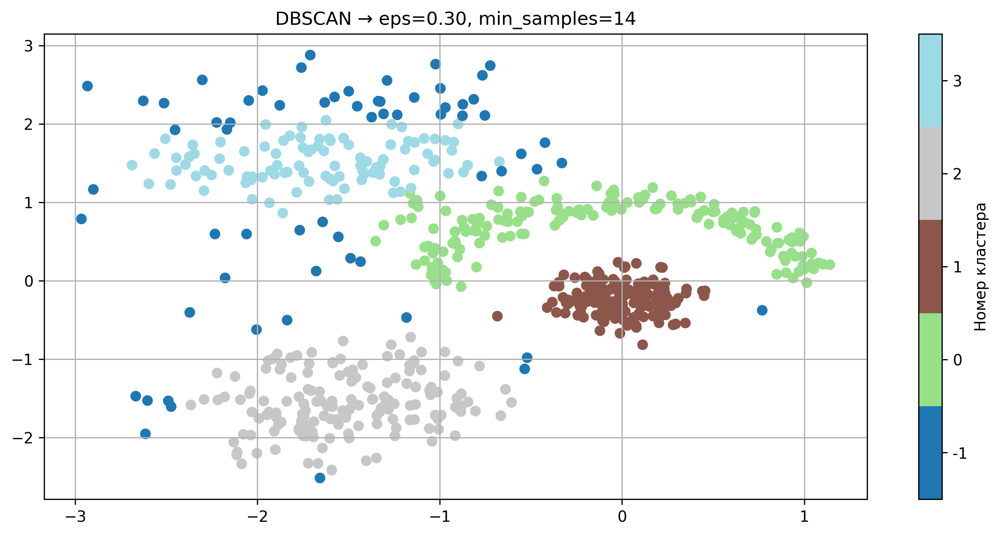

In [34]:
plot_2d_data(data, DBSCAN(eps=0.3, min_samples=14).fit_predict(data), title=f'DBSCAN → eps={0.3:.2f}, min_samples={14}')

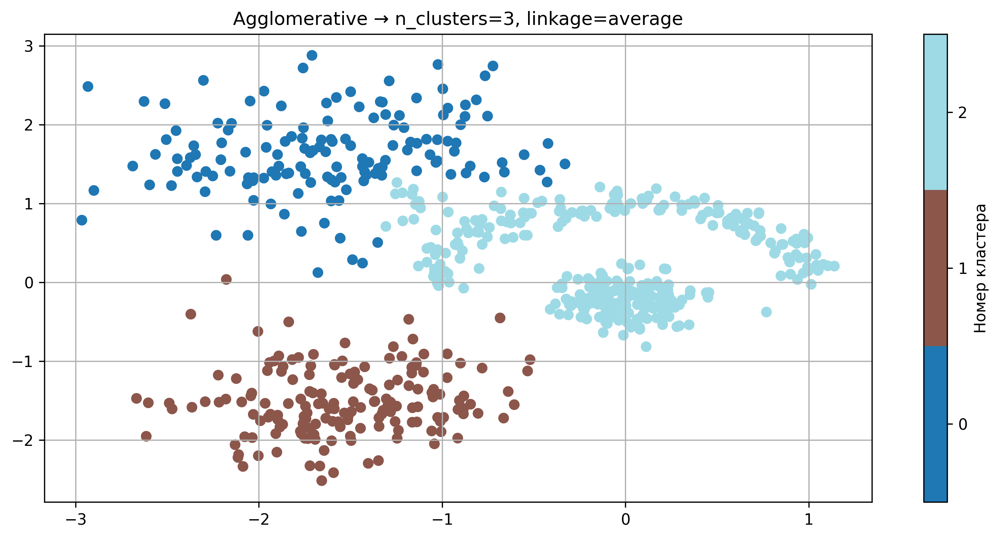

In [33]:
plot_2d_data(data, AgglomerativeClustering(n_clusters=3, linkage="average").fit_predict(data),
             title=f'Agglomerative → n_clusters={3}, linkage=average')

#### <font color='DarkOrange'>**Задание 1.a.2 [кросспроверка, 0.5 балла][вопрос]**</font>
Основываясь на знании о работе данных алгоритмов, объясните, почему кластеры были сформированы таким образом. Какой алгоритм лучше всего работает на предложенных данных?

<font color='MediumOrchid'>**Ваш ответ здесь:**</font> (ｏ・_・)ノ”(ノ_<、):

- **KMeans** решает $$
\min\sum_{k=1}^K\sum_{x_i\in C_k}\|x_i-\mu_k\|^2
$$
и порождает выпуклые ячейки ⟶ не может выделить не-выпуклый полумесяц.
- **Agglomerative (average linkage)** объединяет кластеры по
$$
d_{\rm avg}(A,B)=\frac1{|A||B|}\sum_{x\in A}\sum_{y\in B}\|x-y\|
$$
⟶ эффект цепочки «слипает» луну с ближайшим blob.
- **DBSCAN** строит компоненты через ε-окрестности и MinPts ⟶ сохраняет арбитражные формы и отделяет шум.


**Вывод:** только DBSCAN корректно выделяет полумесяц, два плотных кластера и шум.

## b. Многомерные данные. Снижение размерности

Теперь попробуем кластеризовать данные в высокоразмерном пространстве. Существенным отличием от двумерного случая является невозможность прямой визуальной оценки кластеризации.

Одним из наглядных способов оценки кластеризации является снижение размерности. В данной части вам предлагается использовать алгоритм `TSNE` для визуализации данных.

<font color='CornflowerBlue'>**t-SNE (t-распределенное стохастическое вложение соседей)**</font> — это алгоритм используемый для сокращения размерности данных, а также для визуализации многомерных данных в 2D или 3D, сохраняя их «структуру». Он фокусируется на том, чтобы близкие точки в исходном пространстве оставались близкими в новом, а далёкие — не обязательно. Для этого t-SNE моделирует сходство между точками в высоком измерении (через условные вероятности) и в низком (через распределение Стьюдента), затем итеративно подгоняет проекции, минимизируя разницу между этими сходствами. В итоге кластеры или локальные паттерны становятся видимыми, но абсолютные расстояния и глобальная структура могут искажаться. Алгоритм полезен для исследования данных, но требует осторожности в интерпретации.

In [44]:
data, labels = make_classification(
    n_samples=1000, n_features=200, n_informative=100,
    n_repeated=0, n_classes=5, n_clusters_per_class=2, weights=None,
    flip_y=0.01, class_sep=2.5, hypercube=True, shift=0.0, scale=1.0,
    shuffle=True, random_state=6417
)

####<font color='DarkOrange'>**Задание 1.b.1 [кросспроверка, 0.5 балла][код, вопрос]**</font>
Примените алгоритм `TSNE` для снижения размерности до двух. Учтите, что `TSNE` суть есть метрический алгоритм и существенно зависит от масштаба признаков — некорректный и различающийся масштаб признаков гарантированно приведёт к неинтерпретируемым результатам. Можете попробовать подобрать гиперпараметры алгоритма для получения лучшей визуализации.

Изобразите получившиеся низкоразмерные вектора. Получилось ли сохранить кластеры при переходе в низкоразмерное пространство?

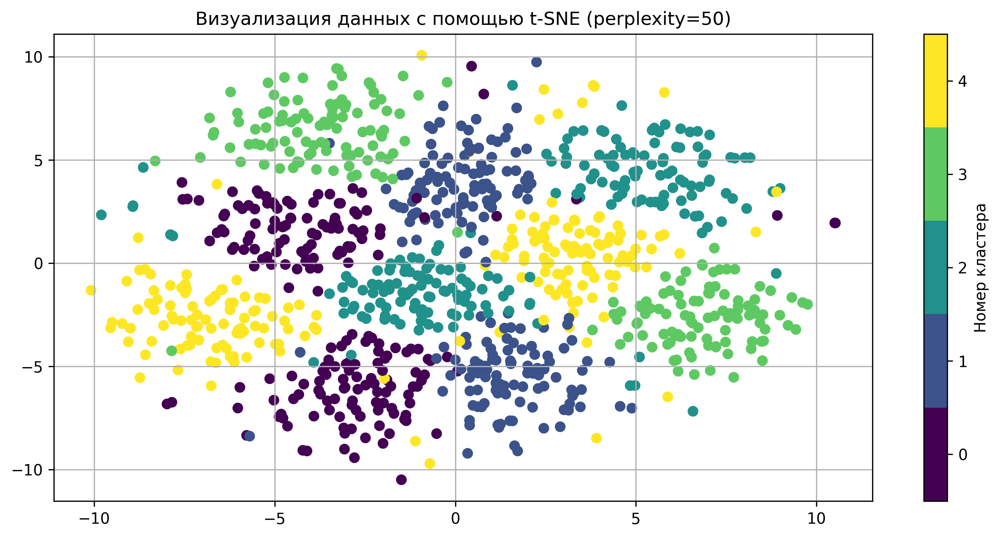

In [54]:
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)
tsne = TSNE(
    n_components=2,
    perplexity=50,
    learning_rate='auto',
    n_iter=1000,
    init='pca',
    random_state=42
)
data_tsne = tsne.fit_transform(data_scaled)
plot_2d_data(data_tsne, labels, title='Визуализация данных с помощью t-SNE (perplexity=50)', cmap='viridis')


<font color='MediumOrchid'>**Ваш ответ здесь:**</font>

При применении **t-SNE** (с $perplexity=50$) визуализация показывает, что точки одного и того же исходного класса группируются вместе (в более кучные группы).

Однако стоит отменить, что из-за изначальной структуры данных (каждый класс состоит из двух подкластеров - $n\_clusters\_per\_class=2$), некоторые классы на 2D-визуализации представлены в виде двух или более отдельных групп

В связи с этим, можно сказать, что не удалось сохранить кластеры в явном виде (одна группа точек)

#### <font color='DarkOrange'>**Задание 1.b.2 [кросспроверка, 0.5 балла][код]**</font>
Примените алгоритмы кластеризации из предыдущего пункта к новым данным. Изобразите получившиеся кластеры в векторном пространстве, полученном с помощью `TSNE`. Не забудьте подобрать оптимальные параметры (те же, что и в пункте [**1.a.1**](#task_1.a.1)) для всех алгоритмов. Помните, что большинство алгоритмов кластеризации также являются метрическими и существенно зависят от масштаба признаков.

<font color='OrangeRed'>**Замечание:**</font> Обратите внимание, что применять алгоритмы кластеризации нужно к высокоразмерным векторам, а низкоразмерные вектора необходимо использовать только для визуализации.

In [57]:
def run_kmeans(k):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans_labels = kmeans.fit_predict(data_scaled)
    plot_2d_data(data_tsne, kmeans_labels, title=f'KMeans Clustering (n_clusters={k})')


interact(
    run_kmeans,
    k=IntSlider(min=2, max=15, step=1, value=5, description='n_clusters')
);

interactive(children=(IntSlider(value=5, description='n_clusters', max=15, min=2), Output()), _dom_classes=('w…

In [59]:
def run_dbscan(eps, min_samples):
    min_samples = max(1, int(min_samples))
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    dbscan_labels = dbscan.fit_predict(data_scaled)
    n_clusters_found = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
    title = f'DBSCAN (eps={eps:.2f}, min_pts={min_samples})\nНайдено кластеров: {n_clusters_found})'
    plot_2d_data(data_tsne, dbscan_labels, title=title)


interact(
    run_dbscan,
    eps=FloatSlider(min=0.1, max=4.0, step=0.05, value=0.7, description='Радиус (eps):', readout_format='.2f'),
    min_samples=IntSlider(min=2, max=30, step=1, value=5, description='Мин. соседей (min_samples):')
);

interactive(children=(FloatSlider(value=0.7, description='Радиус (eps):', max=4.0, min=0.1, step=0.05), IntSli…

In [63]:
def run_agglomerative(n_clusters, linkage):
    agg = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
    agg_labels = agg.fit_predict(data_scaled)
    plot_2d_data(data_tsne, agg_labels, title=f'Agglomerative Clustering (n={n_clusters}, linkage={linkage})')


interact(
    run_agglomerative,
    n_clusters=IntSlider(min=2, max=15, step=1, value=5, description='n_clusters'),
    linkage=ToggleButtons(options=['ward', 'complete', 'average', 'single'], value='ward',
                          description='Метод связи (linkage):')
);

interactive(children=(IntSlider(value=5, description='n_clusters', max=15, min=2), ToggleButtons(description='…

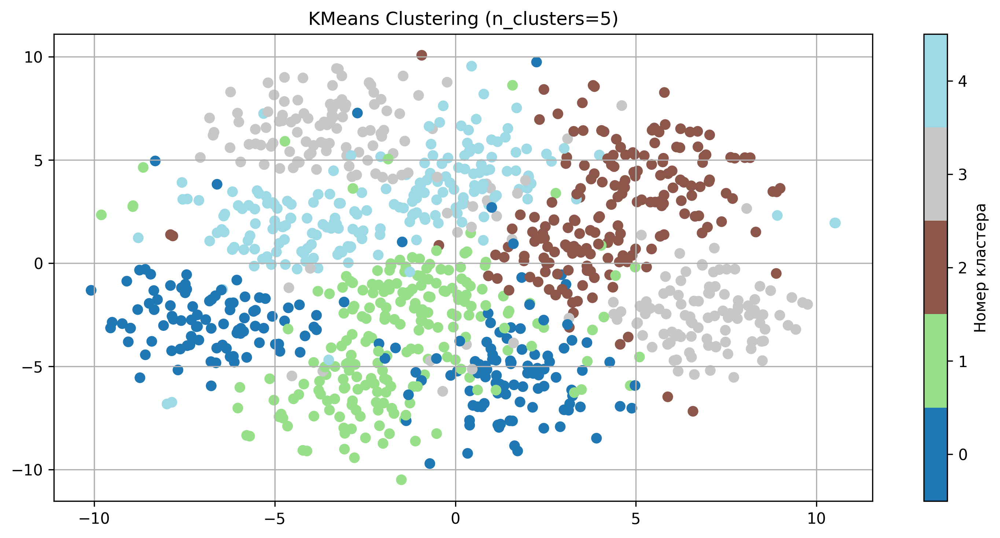

In [65]:
kmeans = KMeans(n_clusters=5, random_state=42, n_init='auto')
kmeans_labels = kmeans.fit_predict(data_scaled)
plot_2d_data(data_tsne, kmeans_labels, title=f'KMeans Clustering (n_clusters={5})')

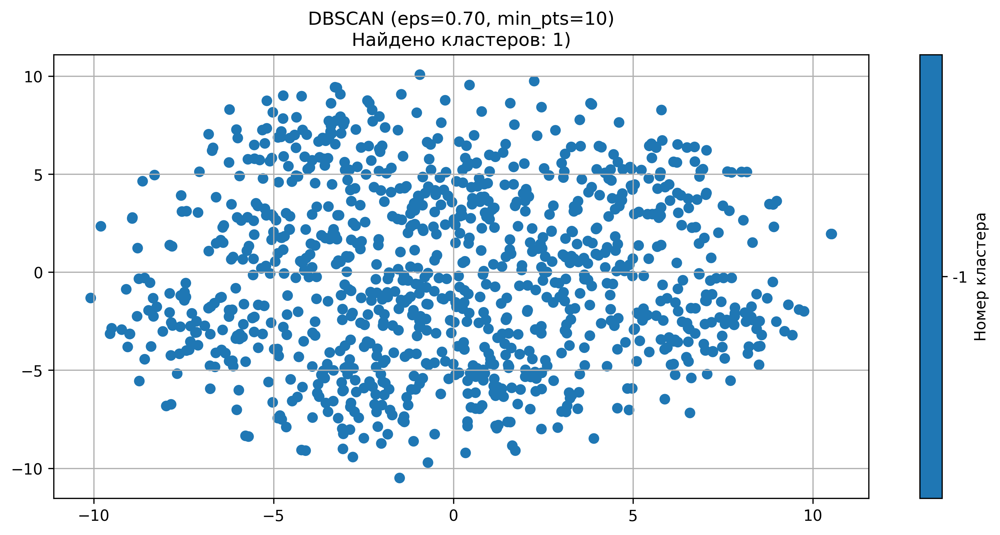

In [64]:
dbscan = DBSCAN(eps=0.7, min_samples=10)
dbscan_labels = dbscan.fit_predict(data_scaled)
title = f'DBSCAN (eps={0.7:.2f}, min_pts={10})\nНайдено кластеров: {1})'
plot_2d_data(data_tsne, dbscan_labels, title=title)

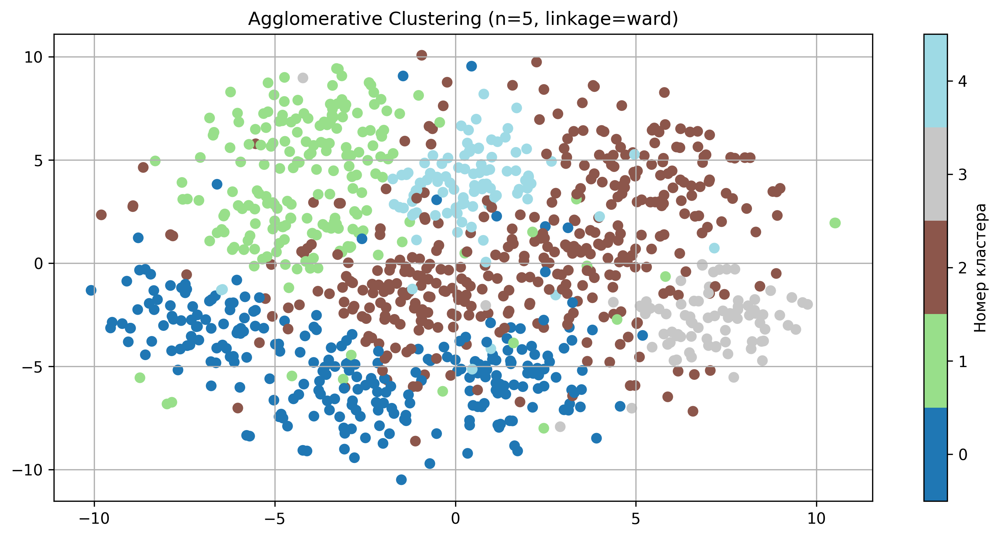

In [66]:
agg = AgglomerativeClustering(n_clusters=5, linkage='ward')
agg_labels = agg.fit_predict(data_scaled)
plot_2d_data(data_tsne, agg_labels, title=f'Agglomerative Clustering (n={5}, linkage=ward)')

#### <font color='DarkOrange'>**Задание 1.b.3 [кросспроверка, 0.5 балла][вопрос]**</font>
Опишите получившиеся результаты. Все ли алгоритмы одинаково хорошо разделяют данные? Если какой-то алгоритм не справился с задачей, то предположите почему.

<font color='MediumOrchid'>**Ваш ответ здесь:**</font>

1. Не все алгоритмы справились одинаково.
    * **KMeans** и **Agglomerative Clustering** показали схожие, умеренно хорошие результаты, сумев разделить данные на 5 групп, которые в целом соответствуют визуальной структуре **t-SNE**.
    * **DBSCAN** с выбранными параметрами ($eps=0.7$, $min\_samples=10$) <u><strong>не справился</strong></u>, объединив все данные в один кластер. Это демонстрирует чувствительность **DBSCAN** к перебору гиперпараметров в соответствии с плотностью и взаимным расположением кластеров в данных.

## c. Методы оценки кластеризации. Внутренние и внешние метрики.

Визуальная оценка кластеризации при работе с высокоразмерными данными затруднительна, так как существенно зависит от выбранного метода снижения размерности, который может плохо работать на конкретных данных. С другой стороны, визуальная оценка — субъективна. Поэтому необходимы численные оценки качества кластеризации.

В данном разделе вам нужно будет реализовать две метрики кластеризации и проверить их на практике.

Существует два основных подхода к оценке кластеризации — внутренние и внешние метрики. Первые используют только информацию о векторах-признаках объектов и метки кластеров, полученные из алгоритма кластеризации. Внешние же, используют информацию об истинной разметке объектов.

### Silhouette

Метрика `силуэт` является классическим представителем внутренних метрик кластеризации. Её суть заключается в оценке двух параметров, характеризующих выделенные кластеры — компактность и отделимость.

Положим, что $C_{i}$ — номер кластера для объекта $i$.

$s_{i}$ — компактность кластеризации объекта $i$ определяется как среднее расстояние от него до всех объектов того же кластера:
$$s_{i} = \frac{1}{|\{j : C_{j} = C_{i}\}| - 1} \sum\limits_{j : C_{j} = C_{i}} || x_{i} - x_{j} ||$$

$d_{i}$ — отделимость кластеризации объекта $i$ определяется как среднее расстояние от него до всех объектов второго по близости кластера:
$$ d_{i} = \min_{C: C \neq C_{i}} \frac{1}{|\{j : C_{j} = C\}|} \sum\limits_{j : C_{j} = C} || x_{i} - x_{j} || $$

Тогда силуэт объекта $i$:
$$\text{sil}_{i} = \frac{d_{i} - s_{i}}{\max(d_{i},s_{i})}$$

И, наконец, коэффициент силуэта для выборки определяется как среднее силуэтов объектов:
$$S = \frac{1}{|X|}\sum\limits_{i} \text{sil}_{i}$$

Если кластер состоит из одного объекта, то его силуэт равен нулю.

#### <font color='DarkOrange'>**Задание 1.с.1 [unittests, 2 баллa]**</font>
Реализуйте вычисление коэффициента силуэта для заданного разбиения. Подробная спецификация и описание входных данных к тестам указаны в **описании задания**.

При реализации обратите внимание на следующие пункты:
1. При вычислении не должно возникать warning, бесконечностей и nan-ов
2. Используйте не более одного цикла
3. Учтите, что метки кластеров могут идти не по порядку и принимать произвольные значения
4. Если в данных присутствует один кластер, то считайте что силуэт равен 0
5. Если $s_{i} = d_{i} = 0 \Longrightarrow \text{sil}_{i} = 0$
5. Разрешено использовать `sklearn.metrics.pairwise_distances` и аналоги
6. Запрещено использовать любые библиотечные реализации коэффициента силуэта

**Входные данные тестов удовлетворяют одному из следующих ограничений:**
1. Число объектов $n \le 3000$, размерность пространства $d \le 1200$
2. Число объектов $n \le 5000$, размерность пространства $d = 1$

**Несколько важных замечаний:**

<font color='OrangeRed'>**Замечание:**</font> Запрещается пользоваться библиотеками, импорт которых не объявлен в файле с шаблонами функций.

<font color='OrangeRed'>**Замечание:**</font> Задания, в которых есть решения, содержащие в каком-либо виде взлом тестов, дополнительные импорты и прочие нечестные приемы, будут автоматически оценены в $0$ баллов без права пересдачи задания.

<font color='OrangeRed'>**Замечание:**</font> Под циклами далее подразумеваются как явные Python-циклы (`for`, `while`, list comprehension, ...), так и неявное использование таких циклов внутри библиотек (`np.apply_along_axis` и подобные). В случае возникновения ошибки **Time limit** проверьте код на соответствие числа используемых циклов с требованиями к реализации.

<font color='OrangeRed'>**Замечание:**</font> Для самопроверки доступны как публичные тесты (смотрите **описание задания**), так и тесты внутри Jupyter Notebook

In [69]:
def silhouette_score(x, labels):
    '''
    Вычисляет коэффициент силуэта для выборки.

    :param np.ndarray x: Непустой двумерный массив векторов-признаков (n_samples, n_features)
    :param np.ndarray labels: Непустой одномерный массив меток объектов (n_samples,)
    :return float: Коэффициент силуэта для выборки x с метками labels
    '''
    n_samples = x.shape[0]
    unique_labels, labels_indices = np.unique(labels, return_inverse=True)
    n_labels = len(unique_labels)
    if n_labels <= 1:
        return 0.0
    distances = sklearn.metrics.pairwise_distances(x, metric='euclidean')
    cluster_sizes = np.bincount(labels_indices, minlength=n_labels)
    s_all = np.zeros(n_samples, dtype=np.float64)
    A = np.zeros((n_samples, n_labels), dtype=np.float64)
    for k in range(n_labels):
        mask_k = (labels_indices == k)
        n_k = cluster_sizes[k]
        if n_k > 1:
            intra_cluster_dists = distances[mask_k][:, mask_k]
            s_all[mask_k] = np.sum(intra_cluster_dists, axis=1, dtype=np.float64) / (n_k - 1)
        sum_dist_to_k = np.sum(distances[:, mask_k], axis=1, dtype=np.float64)
        A[:, k] = sum_dist_to_k / n_k
    A_masked = A.copy()
    A_masked[np.arange(n_samples), labels_indices] = np.inf
    d_all = np.min(A_masked, axis=1)
    max_sd = np.maximum(s_all, d_all)
    sil_i = np.zeros_like(s_all, dtype=np.float64)
    non_zero_denom_mask = (max_sd > np.finfo(np.float64).eps)
    cluster_sizes_per_sample = cluster_sizes[labels_indices]
    multi_point_cluster_mask = (cluster_sizes_per_sample > 1)
    compute_mask = multi_point_cluster_mask & non_zero_denom_mask
    numerator = d_all[compute_mask] - s_all[compute_mask]
    denominator = max_sd[compute_mask]
    sil_i[compute_mask] = numerator / denominator
    sil_score = np.mean(sil_i)
    if not np.isfinite(sil_score):
        return 0.0
    return sil_score

#### <font color='DarkOrange'>**Задание 1.c.2 [кросспроверка, 1 балл][код, вопрос]**</font>
Посчитайте аналитически коэффициенты силуэта для объектов из примера ниже. Посчитайте силуэт аналитически и сравните его с выводом Вашей функции `silhouette_score`.

<font color='OrangeRed'>**Замечание:**</font> Приведите подробные выкладки с использованием $\LaTeX$ (включая значения $s_{i}, d_{i}$). Используйте те же обозначения, что и в теоретической справке выше. Итоговый ответ для силуэта запишите с точностью три знака после запятой.

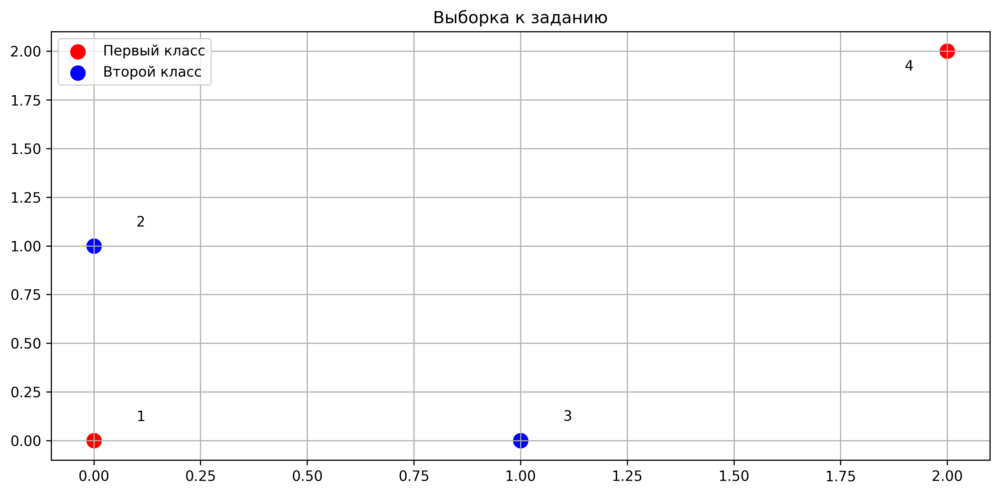

In [68]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.scatter([0, 2], [0, 2], s=100, c='r', label='Первый класс')
ax.scatter([0, 1], [1, 0], s=100, c='b', label='Второй класс')

ax.annotate('1', (0.1, 0.1))
ax.annotate('2', (0.1, 1.1))
ax.annotate('3', (1.1, 0.1))
ax.annotate('4', (1.9, 1.9))

ax.set_title('Выборка к заданию')
ax.grid(True)
ax.legend()

fig.tight_layout()
plt.show()

<font color='MediumOrchid'>**Ваш ответ здесь:**</font>

### Аналитический расчет коэффициента силуэта

**Дано:**

*   Точки:
    *   $x_1 = (0, 0)$
    *   $x_2 = (0, 1)$
    *   $x_3 = (1, 0)$
    *   $x_4 = (2, 2)$
*   Кластеры:
    *   Кластер $C_R = \{x_1, x_4\}$ (Красный)
    *   Кластер $C_B = \{x_2, x_3\}$ (Синий)

**Нормы:**

$|| x_a - x_b || = \sqrt{(x_{a1}-x_{b1})^2 + (x_{a2}-x_{b2})^2}$

*   $||x_1 - x_2|| = \sqrt{(0-0)^2 + (0-1)^2} = 1$
*   $||x_1 - x_3|| = \sqrt{(0-1)^2 + (0-0)^2} = 1$
*   $||x_1 - x_4|| = \sqrt{(0-2)^2 + (0-2)^2} = \sqrt{8} = 2\sqrt{2}$
*   $||x_2 - x_3|| = \sqrt{(0-1)^2 + (1-0)^2} = \sqrt{2}$
*   $||x_2 - x_4|| = \sqrt{(0-2)^2 + (1-2)^2} = \sqrt{4+1} = \sqrt{5}$
*   $||x_3 - x_4|| = \sqrt{(1-2)^2 + (0-2)^2} = \sqrt{1+4} = \sqrt{5}$

**Вычисление $s_i$:**

$s_{i} = \frac{1}{|\{j : C_{j} = C_{i}\}| - 1} \sum\limits_{j : C_{j} = C_{i}, j \neq i} || x_{i} - x_{j} ||$

*   $x_1$: $s_1 = \frac{1}{2-1} ||x_1 - x_4|| = 2\sqrt{2}$
*    $x_2$: $s_2 = \frac{1}{2-1} ||x_2 - x_3|| = \sqrt{2}$
*   $x_3$: $s_3 = \frac{1}{2-1} ||x_3 - x_2|| = \sqrt{2}$
*   $x_4$: $s_4 = \frac{1}{2-1} ||x_4 - x_1|| = 2\sqrt{2}$

**Вычисление $d_i$:**

$d_{i} = \min_{C: C \neq C_{i}} \frac{1}{|\{j : C_{j} = C\}|} \sum\limits_{j : C_{j} = C} || x_{i} - x_{j} ||$

*   Для $x_1 \in C_R$, ближайший кластер $C_B$:
    $d_1 = \frac{1}{|C_B|} (||x_1 - x_2|| + ||x_1 - x_3||) = \frac{1}{2} (1 + 1) = 1$
*   Для $x_2 \in C_B$, ближайший кластер $C_R$:
    $d_2 = \frac{1}{|C_R|} (||x_2 - x_1|| + ||x_2 - x_4||) = \frac{1}{2} (1 + \sqrt{5})$
*   Для $x_3 \in C_B$, ближайший кластер $C_R$:
    $d_3 = \frac{1}{|C_R|} (||x_3 - x_1|| + ||x_3 - x_4||) = \frac{1}{2} (1 + \sqrt{5})$
*   Для $x_4 \in C_R$, ближайший кластер $C_B$:
    $d_4 = \frac{1}{|C_B|} (||x_4 - x_2|| + ||x_4 - x_3||) = \frac{1}{2} (\sqrt{5} + \sqrt{5}) = \sqrt{5}$

**Вычисление $\text{sil}_i$:**

$\text{sil}_{i} = \frac{d_{i} - s_{i}}{\max(d_{i},s_{i})}$

*   $\text{sil}_1$: $s_1 = 2\sqrt{2} \approx 2.828$, $d_1 = 1$, $\max(d_1, s_1) = 2\sqrt{2}$.
    $$\text{sil}_1 = \frac{1 - 2\sqrt{2}}{2\sqrt{2}} = \frac{\sqrt{2}}{4} - 1$$
*   $\text{sil}_2$: $s_2 = \sqrt{2} \approx 1.414$, $d_2 = \frac{1+\sqrt{5}}{2} \approx 1.618$. $\max(d_2, s_2) = d_2$.
    $$\text{sil}_2 = \frac{d_2 - s_2}{d_2} = \frac{\frac{1+\sqrt{5}}{2} - \sqrt{2}}{\frac{1+\sqrt{5}}{2}} = 1 - \frac{2\sqrt{2}}{1+\sqrt{5}} = 1 - \frac{2\sqrt{2}(\sqrt{5}-1)}{(\sqrt{5}+1)(\sqrt{5}-1)} = 1 - \frac{2\sqrt{10}-2\sqrt{2}}{4} = 1 - \frac{\sqrt{10}-\sqrt{2}}{2}$$
*   $\text{sil}_3$: $s_3 = \sqrt{2}$, $d_3 = \frac{1+\sqrt{5}}{2}$. $\max(d_3, s_3) = d_3$.
    $$\text{sil}_3 = \frac{d_3 - s_3}{d_3} = \frac{\frac{1+\sqrt{5}}{2} - \sqrt{2}}{\frac{1+\sqrt{5}}{2}} = 1 - \frac{\sqrt{10}-\sqrt{2}}{2}$$
*   $\text{sil}_4$: $s_4 = 2\sqrt{2} \approx 2.828$, $d_4 = \sqrt{5} \approx 2.236$. $\max(d_4, s_4) = s_4 = 2\sqrt{2}$.
    $$\text{sil}_4 = \frac{d_4 - s_4}{s_4} = \frac{\sqrt{5} - 2\sqrt{2}}{2\sqrt{2}} = \frac{\sqrt{10}}{4} - 1$$

**Вычисление общего силуэта $S$:**

$S = \frac{1}{|X|}\sum\limits_{i=1}^{4} \text{sil}_{i}$

$S = \frac{1}{4} (\text{sil}_1 + \text{sil}_2 + \text{sil}_3 + \text{sil}_4)$

$S = \frac{1}{4} \left[ \left(\frac{\sqrt{2}}{4} - 1\right) + \left(1 - \frac{\sqrt{10}-\sqrt{2}}{2}\right) + \left(1 - \frac{\sqrt{10}-\sqrt{2}}{2}\right) + \left(\frac{\sqrt{10}}{4} - 1\right) \right]$

$S = \frac{1}{4} \left[ \frac{\sqrt{2}}{4} - 1 + 1 - \frac{2(\sqrt{10}-\sqrt{2})}{4} + 1 - \frac{2(\sqrt{10}-\sqrt{2})}{4} + \frac{\sqrt{10}}{4} - 1 \right]$

$S = \frac{1}{16} \left[ \sqrt{2} - 4 + 4 - (2\sqrt{10}-2\sqrt{2}) + 4 - (2\sqrt{10}-2\sqrt{2}) + \sqrt{10} - 4 \right]$

$S = \frac{1}{16} \left[ \sqrt{2} - 2\sqrt{10} + 2\sqrt{2} - 2\sqrt{10} + 2\sqrt{2} + \sqrt{10} \right]$

$S = \frac{1}{16} \left[ (1+2+2)\sqrt{2} + (-2-2+1)\sqrt{10} \right]$

$S = \frac{5\sqrt{2} - 3\sqrt{10}}{16}$

**Численное значение:**

$S \approx \frac{5(1.41421) - 3(3.16228)}{16} \approx \frac{7.07105 - 9.48684}{16} \approx \frac{-2.41579}{16} \approx -0.150987$

**Ответ:**
$\boxed{\approx -0.151}$

In [71]:
x_data = np.array([[0., 0.], [0., 1.], [1., 0.], [2., 2.]])
labels_data = np.array([0, 1, 1, 0])
calculated_silhouette = silhouette_score(x_data, labels_data)
print(calculated_silhouette)

-0.15098532303997897


<a id='task_1.c.1'></a>
Убедитесь, что Ваша реализация проходит минимальные тесты:

In [70]:
assert np.allclose(
    silhouette_score(
        np.array([[0, 0.], [0, 1], [1, 0], [2, 2]]), np.array([1, 0, 0, 1])
    ),
    np.mean([-0.64644661, 0.12596795, 0.12596795, -0.20943058])
)

assert np.allclose(
    silhouette_score(
        np.array([[0, 0.], [0, 1], [1, 0], [2, 2], [1, 1], [2, 0]]), np.array([1, 0, 0, 1, 2, 2])
    ),
    np.mean([-0.64644661, 0.12596795, -0.29289322, -0.39644661, -0.29289322, 0.12596795])
)

### B-Cubed

Пусть существует разметка $(y_1, ... , y_l)$, не участвующая в обучении. Мы не использовали эту разметку в качестве дополнительного признака, так как нам не хочется мотивировать модель данным признаком. Тогда предлагается ввести оценку качества алгоритма кластеризации при помощи внешней разметки, саму же разметку тогда называют *gold standard*.

Один из вариантов учесть gold standard разметку — внешняя метрика B-Cubed. Данная метрика позволяет определять следующие особенности кластеризации:
1. **Гомогенность.** Базовое свойство разделения разных объектов в разные кластеры:




2. **Полнота.** Один кластер не должен дробиться на несколько маленьких:



3. **Rag-bag.** Весь мусор должен быть в одном "мусорном"кластере, чтобы остальные кластеры были "чистыми":



4. **Cluster size vs. quantity.** Лучше испортить один кластер с целью улучшить качество множества других:



Пусть $L(x)$ — gold standard, $C(x)$ — номер кластера, выдаваемый рассматриваемым алгоритмом.

Рассмотрим несколько величин:
$$
\text{Correctness}(x, x^{\prime}) = \begin{cases}
1 , C(x) = C(x^{\prime}) ∧ L(x) = L(x^{\prime})\\
0 , иначе
\end{cases}
$$
$$
\text{Precision-BCubed} = \underset{x}{\text{Avg}} \underset{x^{\prime}:C(x)=C(x^{\prime})}{\text{Avg}} \text{Correctness}(x, x^{\prime})
$$
$$
\text{Recall-BCubed} = \underset{x}{\text{Avg}} \underset{x^{\prime}:L(x)=L(x^{\prime})}{\text{Avg}} \text{Correctness}(x, x^{\prime})
$$

Тогда,
$$
\text{B-Cubed} = F_{1} = 2\frac{\text{Precision-BCubed}\times\text{Recall-BCubed}}{\text{Precision-BCubed}+\text{Recall-BCubed}}
$$

#### <font color='DarkOrange'>**Задание 1.с.3 [unittests, 2 баллa]**</font>
Реализуйте вычисление метрики B-Cubed. Подробная спецификация и описание входных данных к тестам указаны в **описании задания**.

При реализации обратите внимание на следующие пункты:
1. При вычислении не должно возникать warning, бесконечностей и nan-ов.
2. Использование циклов запрещено
3. Обратите внимание на параметр `where` у функций-агрегаторов в `numpy` ($numpy \geq 1.20.0$).
4. Запрещено использовать любые библиотечные реализации B-Cubed.

**Входные данные тестов удовлетворяют одному из следующих ограничений:**
1. Число объектов n ⩽ 1000, число подтестов в одном тесте T ⩽ 70

**Несколько важных замечаний:**

<font color='OrangeRed'>**Замечание:**</font> Запрещается пользоваться библиотеками, импорт которых не объявлен в файле с шаблонами функций.

<font color='OrangeRed'>**Замечание:**</font> Задания, в которых есть решения, содержащие в каком-либо виде взлом тестов, дополнительные импорты и прочие нечестные приемы, будут автоматически оценены в $0$ баллов без права пересдачи задания.

<font color='OrangeRed'>**Замечание:**</font> Под циклами далее подразумеваются как явные Python-циклы (`for`, `while`, list comprehension, ...), так и неявное использование таких циклов внутри библиотек (`np.apply_along_axis` и подобные). В случае возникновения ошибки **Time limit** проверьте код на соответствие числа используемых циклов с требованиями к реализации.

<font color='OrangeRed'>**Замечание:**</font> Для самопроверки доступны как публичные тесты (смотрите **описание задания**), так и тесты внутри Jupyter Notebook

In [72]:
def bcubed_score(true_labels, predicted_labels):
    '''
    :param np.ndarray true_labels: Непустой одномерный массив меток объектов
    :param np.ndarray predicted_labels: Непустой одномерный массив меток объектов
    :return float: B-Cubed для объектов с истинными метками true_labels и предсказанными метками predicted_labels
    '''
    n_samples = len(true_labels)
    if n_samples == 0:
        return 0.0
    C_eq = (predicted_labels[:, None] == predicted_labels)
    L_eq = (true_labels[:, None] == true_labels)
    Correctness = C_eq & L_eq
    sum_correct_precision = np.sum(Correctness * C_eq, axis=1, dtype=np.float64)
    count_precision_pairs = np.sum(C_eq, axis=1, dtype=np.float64)
    precision_per_sample = sum_correct_precision / count_precision_pairs
    avg_precision = np.mean(precision_per_sample)
    sum_correct_recall = np.sum(Correctness * L_eq, axis=1, dtype=np.float64)
    count_recall_pairs = np.sum(L_eq, axis=1, dtype=np.float64)
    recall_per_sample = sum_correct_recall / count_recall_pairs
    avg_recall = np.mean(recall_per_sample)
    numerator = 2 * avg_precision * avg_recall
    denominator = avg_precision + avg_recall
    if denominator == 0:
        bcubed_f1 = 0.0
    else:
        bcubed_f1 = numerator / denominator

    return bcubed_f1

<a id='task_1.c.3'></a>
Убедитесь, что Ваша реализация проходит минимальные тесты:

In [73]:
assert np.allclose(bcubed_score(np.array([1]), np.array([1])), 1.0)
assert np.allclose(bcubed_score(np.array([1]), np.array([2])), 1.0)
assert np.allclose(bcubed_score(np.array([1, 2]), np.array([1, 1])), 2. / 3)
assert np.allclose(bcubed_score(np.array([1, 2]), np.array([1, 2])), 1.0)
assert np.allclose(bcubed_score(np.array([1, 2]), np.array([43, 12])), 1.0)
assert np.allclose(bcubed_score(np.array([1, 1, 2, 2]), np.array([1, 1, 1, 2])), 12. / 17)
assert np.allclose(bcubed_score(np.array([1, 2, 3, 4, 5]), np.array([1, 1, 1, 2, 2])), 4. / 7)

#### <font color='DarkOrange'>**Задание 1.с.4 [кросспроверка, 1 балл][код, вопрос]** </font>
<a id='task_1.c.4'></a>
* Для каждого из трёх алгоритмов кластеризации переберите основные параметры (`n_clusters`, `eps`, `min_samples`) и замерьте качество кластеризации многомерных данных с помощью коэффициента силуэта и метрики B-Cubed.
* Для каждого из алгоритмов на одной фигуре изобразите четыре графика — в первой строке два графика с зависимостью коэффициента силуэта и метрики B-Cubed от варьируемого параметра. Во второй строке — визуализация кластеризации с оптимальным параметром, выбранным с помощью первой и второй метрики (можете использовать `plot_2d_data` с параметром `ax`). Для DBSCAN перебирайте оба параметра одновременно и изобразите 2d-heatmap для каждой из метрик. Можете использовать [вспомогательные функции для создания heatmap](https://matplotlib.org/stable/gallery/images_contours_and_fields/image_annotated_heatmap.html).
* Совпали ли оптимальные параметры, определённые по этим метрикам? Совпали ли они с теми параметрами которые вы подобрали в предыдущем задании? Предположите почему они совпали/не совпали.
* Можно ли использовать данные метрики для оценки кластеризации между разными алгоритмами? Какая из них лучше отражает качество?

In [83]:
def heatmap(data, row_labels, col_labels, ax=None, cbar_kw=None, cbarlabel="", **kwargs):
    if ax is None: ax = plt.gca()
    if cbar_kw is None: cbar_kw = {}
    im = ax.imshow(data, **kwargs)
    cbar = ax.figure.colorbar(im, ax=ax, **cbar_kw)
    cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom")
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_yticks(np.arange(data.shape[0]))
    ax.set_xticklabels(col_labels, fontsize=8)
    ax.set_yticklabels(row_labels, fontsize=8)
    ax.tick_params(top=True, bottom=False, labeltop=True, labelbottom=False)
    plt.setp(ax.get_xticklabels(), rotation=-30, ha="right", rotation_mode="anchor")
    ax.spines[:].set_visible(False)
    ax.set_xticks(np.arange(data.shape[1] + 1) - .5, minor=True)
    ax.set_yticks(np.arange(data.shape[0] + 1) - .5, minor=True)
    ax.grid(which="minor", color="w", linestyle='-', linewidth=3)
    ax.tick_params(which="minor", bottom=False, left=False)
    return im, cbar


def annotate_heatmap(im, data=None, valfmt="{x:.2f}", textcolors=("black", "white"), threshold=None, **textkw):
    if not isinstance(data, (list, np.ndarray)): data = im.get_array()
    if threshold is None: threshold = im.norm(data.max()) / 2.
    kw = dict(horizontalalignment="center", verticalalignment="center", fontsize=7)
    kw.update(textkw)
    if isinstance(valfmt, str): valfmt = plt.matplotlib.ticker.StrMethodFormatter(valfmt)
    texts = []
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            kw.update(color=textcolors[int(im.norm(data[i, j]) > threshold)])
            text = im.axes.text(j, i, valfmt(data[i, j], None), **kw)
            texts.append(text)
    return texts

In [84]:
data, labels_true = make_classification(
    n_samples=1000, n_features=200, n_informative=100,
    n_repeated=0, n_classes=5, n_clusters_per_class=2, weights=None,
    flip_y=0.01, class_sep=2.5, hypercube=True, shift=0.0, scale=1.0,
    shuffle=True, random_state=6417
)
print(f"Размерность исходных данных: {data.shape}")
print(f"Истинное количество классов: {len(np.unique(labels_true))}")

scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

tsne = TSNE(
    n_components=2, perplexity=30, learning_rate='auto',
    n_iter=1000, init='pca', random_state=42
)
data_tsne = tsne.fit_transform(data_scaled)


Размерность исходных данных: (1000, 200)
Истинное количество классов: 5



Optimal k (Silhouette): 12 (Score: 0.0218)
Optimal k (B-Cubed): 12 (Score: 0.5777)


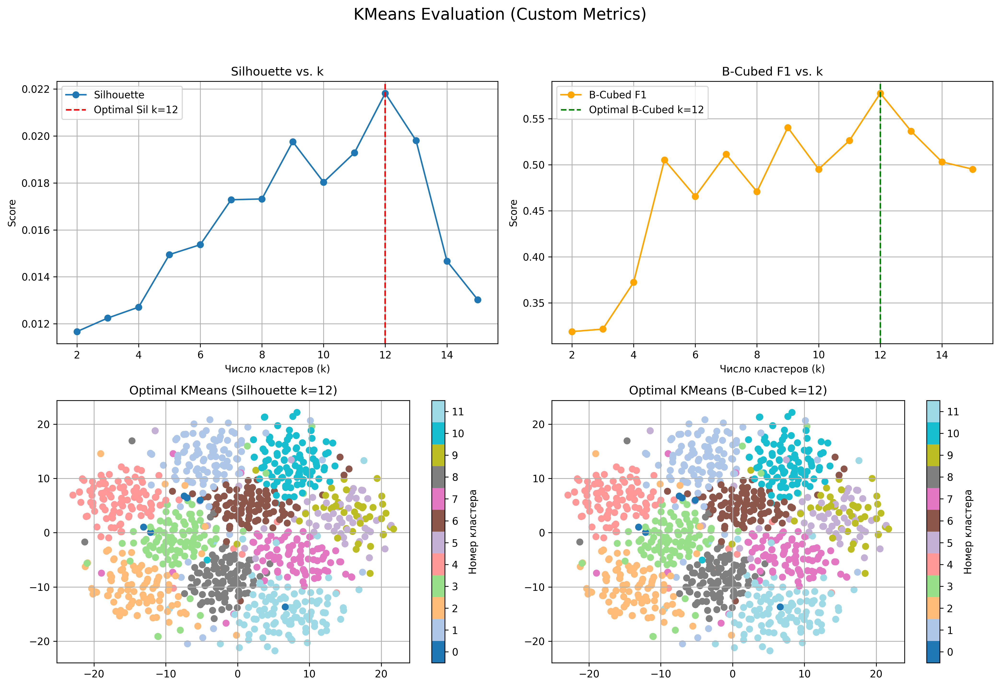

In [85]:
k_range = range(2, 16)
silhouette_scores_km = []
bcubed_scores_km = []

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    labels_pred_km = kmeans.fit_predict(data_scaled)

    score_sil = silhouette_score(data_scaled, labels_pred_km)
    score_bcubed = bcubed_score(labels_true, labels_pred_km)

    silhouette_scores_km.append(score_sil)
    bcubed_scores_km.append(score_bcubed)
optimal_k_sil_km = k_range[np.argmax(silhouette_scores_km)]
optimal_k_bcubed_km = k_range[np.argmax(bcubed_scores_km)]
print(f"\nOptimal k (Silhouette): {optimal_k_sil_km} (Score: {max(silhouette_scores_km):.4f})")
print(f"Optimal k (B-Cubed): {optimal_k_bcubed_km} (Score: {max(bcubed_scores_km):.4f})")

fig_km, axes_km = plt.subplots(2, 2, figsize=(14, 10))
fig_km.suptitle("KMeans Evaluation (Custom Metrics)", fontsize=16)

axes_km[0, 0].plot(k_range, silhouette_scores_km, marker='o', label='Silhouette')
axes_km[0, 0].set_xlabel("Число кластеров (k)")
axes_km[0, 0].set_ylabel("Score")
axes_km[0, 0].set_title("Silhouette vs. k")
axes_km[0, 0].grid(True)
axes_km[0, 0].axvline(optimal_k_sil_km, color='r', linestyle='--', label=f'Optimal Sil k={optimal_k_sil_km}')
axes_km[0, 0].legend()

axes_km[0, 1].plot(k_range, bcubed_scores_km, marker='o', label='B-Cubed F1', color='orange')
axes_km[0, 1].set_xlabel("Число кластеров (k)")
axes_km[0, 1].set_ylabel("Score")
axes_km[0, 1].set_title("B-Cubed F1 vs. k")
axes_km[0, 1].grid(True)
axes_km[0, 1].axvline(optimal_k_bcubed_km, color='g', linestyle='--', label=f'Optimal B-Cubed k={optimal_k_bcubed_km}')
axes_km[0, 1].legend()

kmeans_sil = KMeans(n_clusters=optimal_k_sil_km, random_state=42, n_init='auto')
labels_sil_km = kmeans_sil.fit_predict(data_scaled)
plot_2d_data(data_tsne, labels_sil_km, title=f'Optimal KMeans (Silhouette k={optimal_k_sil_km})', ax=axes_km[1, 0])

kmeans_bcubed = KMeans(n_clusters=optimal_k_bcubed_km, random_state=42, n_init='auto')
labels_bcubed_km = kmeans_bcubed.fit_predict(data_scaled)
plot_2d_data(data_tsne, labels_bcubed_km, title=f'Optimal KMeans (B-Cubed k={optimal_k_bcubed_km})', ax=axes_km[1, 1])

fig_km.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


Optimal n_clusters (Silhouette): 11 (Score: 0.0161)
Optimal n_clusters (B-Cubed): 6 (Score: 0.5022)


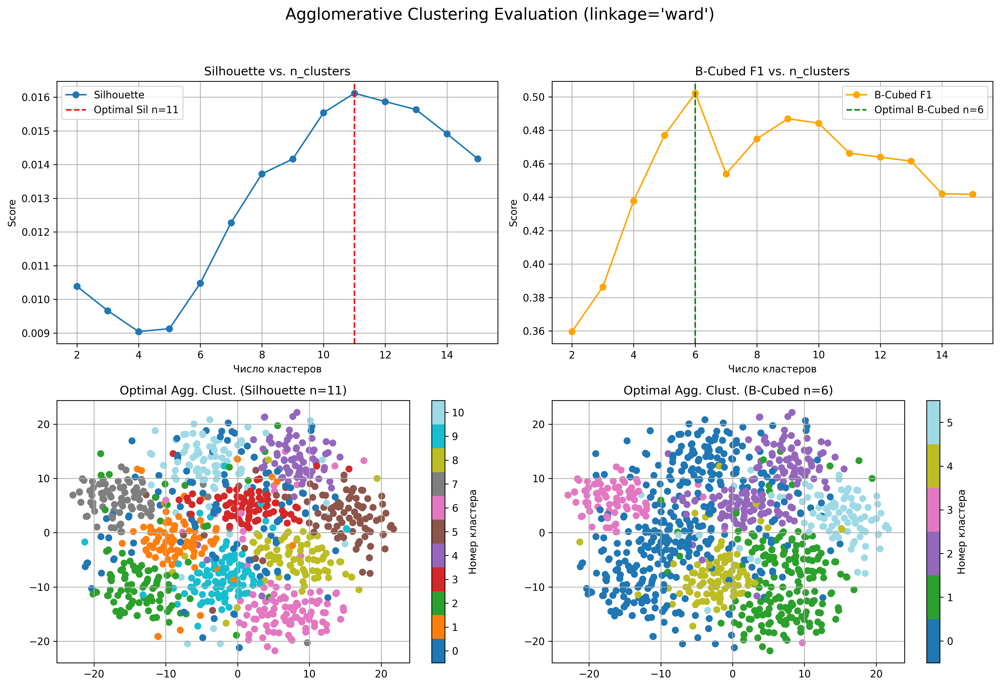

In [86]:
n_clusters_range = range(2, 16)
silhouette_scores_agg = []
bcubed_scores_agg = []
linkage_method = 'ward'

for n in n_clusters_range:
    agg_clust = AgglomerativeClustering(n_clusters=n, linkage=linkage_method)
    labels_pred_agg = agg_clust.fit_predict(data_scaled)

    score_sil = silhouette_score(data_scaled, labels_pred_agg)  # Ваша функция
    score_bcubed = bcubed_score(labels_true, labels_pred_agg)  # Ваша функция

    silhouette_scores_agg.append(score_sil)
    bcubed_scores_agg.append(score_bcubed)

optimal_n_sil_agg = n_clusters_range[np.argmax(silhouette_scores_agg)]
optimal_n_bcubed_agg = n_clusters_range[np.argmax(bcubed_scores_agg)]
print(f"\nOptimal n_clusters (Silhouette): {optimal_n_sil_agg} (Score: {max(silhouette_scores_agg):.4f})")
print(f"Optimal n_clusters (B-Cubed): {optimal_n_bcubed_agg} (Score: {max(bcubed_scores_agg):.4f})")

fig_agg, axes_agg = plt.subplots(2, 2, figsize=(14, 10))
fig_agg.suptitle(f"Agglomerative Clustering Evaluation (linkage='{linkage_method}')", fontsize=16)

axes_agg[0, 0].plot(n_clusters_range, silhouette_scores_agg, marker='o', label='Silhouette')
axes_agg[0, 0].set_xlabel("Число кластеров")
axes_agg[0, 0].set_ylabel("Score")
axes_agg[0, 0].set_title("Silhouette vs. n_clusters")
axes_agg[0, 0].grid(True)
axes_agg[0, 0].axvline(optimal_n_sil_agg, color='r', linestyle='--', label=f'Optimal Sil n={optimal_n_sil_agg}')
axes_agg[0, 0].legend()

axes_agg[0, 1].plot(n_clusters_range, bcubed_scores_agg, marker='o', label='B-Cubed F1', color='orange')
axes_agg[0, 1].set_xlabel("Число кластеров")
axes_agg[0, 1].set_ylabel("Score")
axes_agg[0, 1].set_title("B-Cubed F1 vs. n_clusters")
axes_agg[0, 1].grid(True)
axes_agg[0, 1].axvline(optimal_n_bcubed_agg, color='g', linestyle='--',
                       label=f'Optimal B-Cubed n={optimal_n_bcubed_agg}')
axes_agg[0, 1].legend()

agg_sil = AgglomerativeClustering(n_clusters=optimal_n_sil_agg, linkage=linkage_method)
labels_sil_agg = agg_sil.fit_predict(data_scaled)
plot_2d_data(data_tsne, labels_sil_agg, title=f'Optimal Agg. Clust. (Silhouette n={optimal_n_sil_agg})',
             ax=axes_agg[1, 0])

agg_bcubed = AgglomerativeClustering(n_clusters=optimal_n_bcubed_agg, linkage=linkage_method)
labels_bcubed_agg = agg_bcubed.fit_predict(data_scaled)
plot_2d_data(data_tsne, labels_bcubed_agg, title=f'Optimal Agg. Clust. (B-Cubed n={optimal_n_bcubed_agg})',
             ax=axes_agg[1, 1])

fig_agg.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


Optimal params (Silhouette): eps=0.50, min_samples=5 (Score: -1.0000)
Optimal params (B-Cubed): eps=0.50, min_samples=5 (Score: 0.3334)


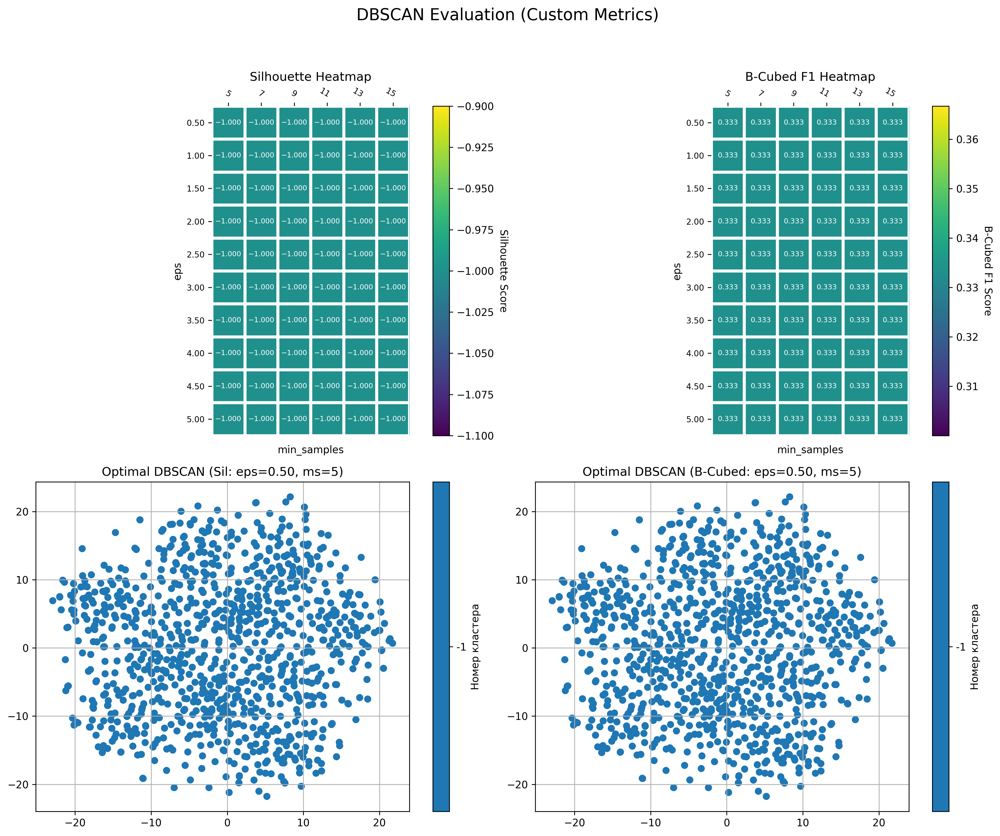

In [88]:
eps_range = np.linspace(0.5, 5.0, 10)
min_samples_range = np.arange(5, 16, 2)

silhouette_matrix = np.full((len(eps_range), len(min_samples_range)), -1.0)
bcubed_matrix = np.zeros((len(eps_range), len(min_samples_range)))

for i, eps in enumerate(eps_range):
    for j, min_samples in enumerate(min_samples_range):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples, n_jobs=-1)
        labels_pred_db = dbscan.fit_predict(data_scaled)

        unique_pred_labels = np.unique(labels_pred_db)
        n_clusters_found = len(unique_pred_labels) - (1 if -1 in unique_pred_labels else 0)

        if n_clusters_found >= 2:
            score_sil = silhouette_score(data_scaled, labels_pred_db)
            silhouette_matrix[i, j] = score_sil

        score_bcubed = bcubed_score(labels_true, labels_pred_db)
        bcubed_matrix[i, j] = score_bcubed

max_sil_idx = np.unravel_index(np.argmax(silhouette_matrix, axis=None), silhouette_matrix.shape)
max_bcubed_idx = np.unravel_index(np.argmax(bcubed_matrix, axis=None), bcubed_matrix.shape)

optimal_eps_sil_db = eps_range[max_sil_idx[0]]
optimal_ms_sil_db = min_samples_range[max_sil_idx[1]]
optimal_eps_bcubed_db = eps_range[max_bcubed_idx[0]]
optimal_ms_bcubed_db = min_samples_range[max_bcubed_idx[1]]

print(
    f"\nOptimal params (Silhouette): eps={optimal_eps_sil_db:.2f}, min_samples={optimal_ms_sil_db} (Score: {silhouette_matrix[max_sil_idx]:.4f})")
print(
    f"Optimal params (B-Cubed): eps={optimal_eps_bcubed_db:.2f}, min_samples={optimal_ms_bcubed_db} (Score: {bcubed_matrix[max_bcubed_idx]:.4f})")

fig_db, axes_db = plt.subplots(2, 2, figsize=(14, 12))  # Увеличил высоту
fig_db.suptitle("DBSCAN Evaluation (Custom Metrics)", fontsize=16)

eps_labels = [f"{eps:.2f}" for eps in eps_range]
ms_labels = [f"{ms}" for ms in min_samples_range]

im_sil, _ = heatmap(silhouette_matrix, eps_labels, ms_labels, ax=axes_db[0, 0],
                    cmap="viridis", cbarlabel="Silhouette Score")
annotate_heatmap(im_sil, valfmt="{x:.3f}")
axes_db[0, 0].set_xlabel("min_samples")
axes_db[0, 0].set_ylabel("eps")
axes_db[0, 0].set_title("Silhouette Heatmap")

im_bcubed, _ = heatmap(bcubed_matrix, eps_labels, ms_labels, ax=axes_db[0, 1],
                       cmap="viridis", cbarlabel="B-Cubed F1 Score")
annotate_heatmap(im_bcubed, valfmt="{x:.3f}")
axes_db[0, 1].set_xlabel("min_samples")
axes_db[0, 1].set_ylabel("eps")
axes_db[0, 1].set_title("B-Cubed F1 Heatmap")

dbscan_sil = DBSCAN(eps=optimal_eps_sil_db, min_samples=optimal_ms_sil_db)
labels_sil_db = dbscan_sil.fit_predict(data_scaled)
plot_2d_data(data_tsne, labels_sil_db,
             title=f'Optimal DBSCAN (Sil: eps={optimal_eps_sil_db:.2f}, ms={optimal_ms_sil_db})', ax=axes_db[1, 0])

dbscan_bcubed = DBSCAN(eps=optimal_eps_bcubed_db, min_samples=optimal_ms_bcubed_db)
labels_bcubed_db = dbscan_bcubed.fit_predict(data_scaled)
plot_2d_data(data_tsne, labels_bcubed_db,
             title=f'Optimal DBSCAN (B-Cubed: eps={optimal_eps_bcubed_db:.2f}, ms={optimal_ms_bcubed_db})',
             ax=axes_db[1, 1])

fig_db.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

<font color='MediumOrchid'>**Ваш ответ здесь:**</font>

**1. Совпадение оптимальных параметров:**

*   Оптимальные параметры отличаются от тех, что были найдены ранее.

**2. Причины совпадений/расхождений:**

*   **Silhouette vs. B-Cubed:**
    *   Silhouette - **внутренняя** метрика. Оценивает геометрическую структуру кластеров (компактность и отделимость) в *пространстве признаков* (`data_scaled`). Она не использует истинные метки. Максимум Silhouette соответствует наиболее "четким" кластерам с точки зрения геометрии.
    *   B-Cubed - **внешняя** метрика. Оценивает, насколько предсказанные кластеры соответствуют *истинным меткам* (`labels_true`), сравнивая принадлежность пар точек к кластерам. Максимум B-Cubed соответствует наилучшему совпадению с ground truth.

*   **Метрики vs. Визуальный подбор на t-SNE:**
    *   Метрики (Silhouette, B-Cubed) рассчитывались на **исходных многомерных данных** (`data_scaled`).
    *   Визуальный подбор производился на **2D проекции** (`data_tsne`).
    *   t-SNE - это нелинейный метод снижения размерности, который хорошо сохраняет *локальную* структуру (принадлежность к кластеру), но *глобальные* расстояния и плотности могут искажаться.
    *   Поэтмоу подбор через метрику может быть лучше, чем обычный визуальный анализ

**3. Использование метрик для сравнения алгоритмов:**

*   **Можно ли сравнивать?** Да, обе метрики можно использовать для сравнения *результатов* разных алгоритмов кластеризации на *одном и том же наборе данных*.

**4. Какая метрика лучше отражает качество?**

*   Нет однозначного ответа "лучше". Выбор зависит от **цели кластеризации**:
    *   Если цель - найти "естественные" группы в данных, основываясь только на их структуре, и нет информации об истинных классах, то **Silhouette** (или другие внутренние метрики) является основным инструментом оценки.
    *   Если цель - проверить, насколько хорошо алгоритм может восстановить известную структуру классов (например, для полуавтоматической разметки или оценки способности алгоритма разделять известные категории), то **B-Cubed** (или V-мера, ARI и т.д.) является более подходящей метрикой.
    *   Часто полезно смотреть на **обе метрики**: хороший алгоритм в идеале должен давать и геометрически осмысленные кластеры , и хорошо соответствовать истинным меткам , если они доступны.

## <font color='MediumSeaGreen'> **Задание 2 [Bonus][1 балл]** </font>



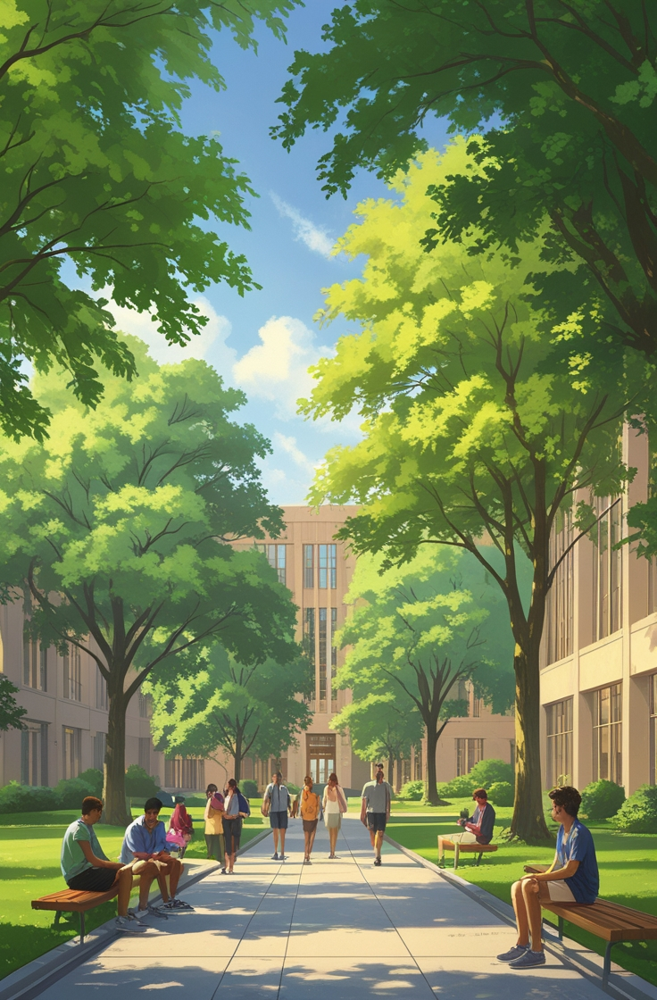

Подкиньте друг другу 3+ идеи, куда сходить/чем заняться на майских :)

Или вставьте/сгенерируйте любой смешной мем на тему весны/лета

In [ ]:
gdown.download(id='16UgWo1Emt9ar1O4h2Xxed0ZpJZ0OG5V-', output='cifar10_deep_features.npy')